<div style="background-color:#ffb770   ;padding:5px;border-radius:10px;border:10px solid #a3a3a3;color:#000000  ;text-align:center; font-weight: 1000; font-family: Babas; font-size: 3.0em;">
<p style="text-align:center;" > Automatic categorisation of stack overflow questions  |Exploratory Data Analysis (EDA)</p>
    
<p style="text-align:center;" ><img src="https://www.silicon.fr/wp-content/uploads/2019/08/stack_overflow.jpg"   width="400" height="250"/></p>
</div>

<a id="IR"></a>
<h1 style="background-color:#ffb770 ;padding:20px;border-radius:10px;border:10px solid #a3a3a3;font-weight: 1000;color:#000000;text-align:center; font-size: 2.0em" >Import libraries and data</h1>


<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Import libraries </span>

As we can see, these lines have the same title, but the question and tag are not the same values. We don't need to drop this duplicated line because it can be good for our tag classification.

We don't have any nan values.

In [1]:
#builtin
import os, sys, time, random

#data
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

import re 

from bs4 import BeautifulSoup
import unicodedata
import contractions
import nltk
import string
from nltk.stem import WordNetLemmatizer 

from nltk.corpus import words, stopwords
from wordcloud import WordCloud

from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer

import plotly.express as px
import plotly.graph_objects as go

from pandarallel import pandarallel
from tqdm.notebook import tqdm
tqdm.pandas()

In [2]:
#pandarallel
pandarallel.initialize(progress_bar=True,
                      nb_workers=6,
                      verbose=1)

In [3]:
# download

"""
nltk.download('omw-1.4')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('words')
nltk.download('punkt')
"""

"\nnltk.download('omw-1.4')\nnltk.download('wordnet')\nnltk.download('stopwords')\nnltk.download('words')\nnltk.download('punkt')\n"

In [4]:
DEBUG = False

In [5]:
sns.set()

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Data loading and reading </span>

SELECT TOP 500000 Title, Body, Tags, Id, Score, ViewCount, FavoriteCount, AnswerCount, CreationDate, CommentCount

FROM Posts

WHERE PostTypeId = 1

AND Score > 5

AND ViewCount > 10

AND AnswerCount IS NOT NULL

AND CommentCount IS NOT NULL

AND FavoriteCount IS NOT NULL

AND LEN(Tags) - LEN(REPLACE(Tags, '<','')) >= 5

In [6]:
path = "./data/raw_data/"
os.listdir(path)
data = pd.read_csv(path+"top_50000.csv")

<a id="IR"></a>
<h1 style="background-color:#ffb770 ;padding:20px;border-radius:10px;border:10px solid #a3a3a3;font-weight: 1000;color:#000000;text-align:center; font-size: 2.0em" >Data preprocessing</h1>


<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Display </span>

In [7]:
data.head()

,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount,CreationDate,CommentCount
0,Multithreading in a stateless session bean?,<p>The EJB 3.0 specification does not allow a ...,<java><multithreading><jakarta-ee><ejb-3.0><ejb>,3816286,9,13503,0,4,2010-09-28 19:22:19,0
1,base64 JSON encoded strings in nodejs,<p>How do I create a base64 JSON encoded strin...,<javascript><json><node.js><base64><buffer>,22515180,14,23710,0,3,2014-03-19 18:35:48,2
2,"Link error: ""Cannot find -ltinfo"" on Ubuntu 12...",<p>I get the following link error when I'm com...,<c++><ubuntu><arm><static-libraries><ubuntu-12...,21137879,21,17090,0,2,2014-01-15 12:49:03,4
3,How to sort array of strings which contains bo...,"<blockquote>\n<pre><code>String str[]={""-123"",...",<c++><arrays><string><algorithm><sorting>,58516048,8,905,0,2,2019-10-23 05:31:23,4
4,Multithreading program stuck in optimized mode...,<p>I wrote a simple multithreading programs as...,<c++><multithreading><thread-safety><undefined...,58516052,70,7384,0,3,2019-10-23 05:31:57,1


In [8]:
data.tail()

,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount,CreationDate,CommentCount
49995,Firebase photoURL from a Google auth provider ...,<p>When I authenticate a user via Firebase (be...,<javascript><image><firebase><firebase-authent...,42893664,6,840,0,1,2017-03-19 23:32:26,1
49996,"EmberJS, polling, update route's model, re-ren...",<p>I've been looking for mechanism to update t...,<ember.js><model><controller><routes><refresh>,24854340,7,9780,0,2,2014-07-20 19:56:53,4
49997,Javascript Namespacing,<p>I wish to make my javascript more more modu...,<javascript><jquery><inheritance><module><name...,7684452,11,3037,0,3,2011-10-07 07:52:00,3
49998,Kotlin prepend element,<p>I am searching for Kotlin alternative to:<b...,<list><insert><kotlin><prepend><cons>,42892197,33,23662,0,8,2017-03-19 21:00:19,4
49999,How can I make the first and second column of ...,<p>i have a <code>div</code> with with propert...,<javascript><jquery><css><css-tables><sticky>,7684111,7,11588,0,2,2011-10-07 07:12:19,1


In [9]:
data.sample(10)

,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount,CreationDate,CommentCount
40492,org.openqa.selenium.interactions.MoveTargetOut...,<p>I am learning how to automate tests with Se...,<java><selenium><firefox><geckodriver><mouseho...,55413422,7,16576,0,5,2019-03-29 08:40:20,2
9592,"Set content files to ""copy local : always"" in ...",<p>I generate a nuget package from a project w...,<visual-studio><visual-studio-2012><nuget><nug...,21143817,67,41748,0,5,2014-01-15 17:08:41,1
40487,Is there a way to secure an Azure Function tha...,<p>I understand that Azure Functions are poten...,<azure><security><azure-active-directory><azur...,55407966,8,4098,0,2,2019-03-28 22:46:22,0
37022,Chrome CSS 3 Transition Not Smooth,<p>Hi working on a site design for a new site ...,<html><wordpress><css><google-chrome><responsi...,17754561,6,26694,0,2,2013-07-19 20:02:24,1
36313,Reading an NDEF message from an NFC tag from a...,<p>I am trying to create an application using ...,<android><nfc><android-pendingintent><payload>...,17587963,7,27268,0,1,2013-07-11 07:55:47,2
25979,Auto-import doesn't follow PEP8,<p>Consider the following code:</p>\n\n<pre><c...,<python><import><pycharm><pep8><static-code-an...,27369138,16,1258,0,1,2014-12-08 23:51:10,3
41345,SqlException - The network path was not found,<p>I'm running my code and getting this error....,<sql><.net><sql-server><database><networking>,21448728,42,150225,0,13,2014-01-30 05:41:19,4
11081,4 Element Vector (3D Math),<p>Why is there a W term in a lot of 3D API's ...,<math><opengl><3d><vector><directx>,3847743,10,3806,0,1,2010-10-02 22:21:45,0
39598,custom marker icon with react-leaflet,"<p>I tried everything I found on the web, Stac...",<icons><maps><leaflet><marker><react-leaflet>,47723812,36,59720,0,7,2017-12-08 23:55:57,0
38776,Sparse Image matching in iOS,"<p>I am building an iOS app that, as a key fea...",<ios><objective-c><image-processing><static-li...,14713002,7,1427,0,2,2013-02-05 17:09:45,6


Our feature of interest seems to have different values. Let's explore the structure of the dataset.

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Structure </span>

In [10]:
data.shape

(50000, 10)

In [11]:
data.dtypes

Title            object
Body             object
Tags             object
Id                int64
Score             int64
ViewCount         int64
FavoriteCount     int64
AnswerCount       int64
CreationDate     object
CommentCount      int64
dtype: object

In [12]:
data.dtypes.value_counts()

int64     6
object    4
dtype: int64

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50000 entries, 0 to 49999
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Title          50000 non-null  object
 1   Body           50000 non-null  object
 2   Tags           50000 non-null  object
 3   Id             50000 non-null  int64 
 4   Score          50000 non-null  int64 
 5   ViewCount      50000 non-null  int64 
 6   FavoriteCount  50000 non-null  int64 
 7   AnswerCount    50000 non-null  int64 
 8   CreationDate   50000 non-null  object
 9   CommentCount   50000 non-null  int64 
dtypes: int64(6), object(4)
memory usage: 3.8+ MB


In [14]:
data.nunique()

Title            49999
Body             50000
Tags             49188
Id               50000
Score              784
ViewCount        28667
FavoriteCount        3
AnswerCount         67
CreationDate     49982
CommentCount        41
dtype: int64

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Nan and dupliated </span>

In [15]:
data.isna().sum()

Title            0
Body             0
Tags             0
Id               0
Score            0
ViewCount        0
FavoriteCount    0
AnswerCount      0
CreationDate     0
CommentCount     0
dtype: int64

<Axes: >

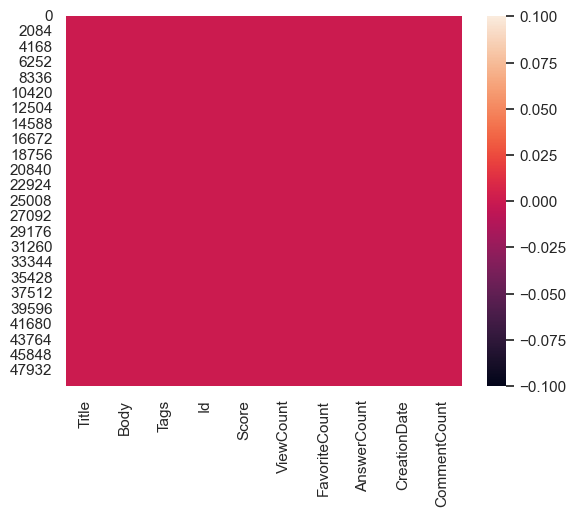

In [16]:
sns.heatmap(data.isna())

In [17]:
data.duplicated().sum()

0

In [18]:
for col in data.columns :
    n = data.duplicated(subset=col).sum()
    print(f"col: {col} -> duplicated: {n}")

col: Title -> duplicated: 1
col: Body -> duplicated: 0
col: Tags -> duplicated: 812
col: Id -> duplicated: 0
col: Score -> duplicated: 49216
col: ViewCount -> duplicated: 21333
col: FavoriteCount -> duplicated: 49997
col: AnswerCount -> duplicated: 49933
col: CreationDate -> duplicated: 18
col: CommentCount -> duplicated: 49959


For our feature of interest, there is duplication for target values which is good, and for our title for which we need to look deeper.

In [19]:
data[data.duplicated(subset="Title", keep=False)]

,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount,CreationDate,CommentCount
18924,A potentially dangerous Request.Form value was...,<p>I have this issue. I have tried everything....,<c#><jquery><asp.net><architecture><postback>,9130186,25,113554,0,8,2012-02-03 14:28:36,8
31360,A potentially dangerous Request.Form value was...,<p>Every time a user posts something containin...,<asp.net><asp.net-mvc><validation><html-encode...,81991,1574,1117245,0,47,2008-09-17 10:58:14,6


<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Data inspection </span>

In [20]:
data.describe(include=np.number)

,Id,Score,ViewCount,FavoriteCount,AnswerCount,CommentCount
count,5.000000e+04,50000.00000,5.000000e+04,50000.000000,50000.000000,50000.000000
mean,2.151408e+07,35.50314,3.422462e+04,0.000680,3.902000,2.357620
std,1.814704e+07,178.51990,1.217968e+05,0.143248,4.191504,3.310497
min,4.000000e+00,6.00000,4.700000e+01,0.000000,0.000000,0.000000
25%,7.002489e+06,7.00000,3.697750e+03,0.000000,2.000000,0.000000
50%,1.777963e+07,11.00000,9.759000e+03,0.000000,3.000000,1.000000
75%,3.482393e+07,22.00000,2.561900e+04,0.000000,5.000000,3.000000
max,7.302899e+07,9955.00000,5.545755e+06,32.000000,126.000000,71.000000


In [21]:
data.describe(include=object)

,Title,Body,Tags,CreationDate
count,50000,50000,50000,50000
unique,49999,50000,49188,49982
top,A potentially dangerous Request.Form value was...,<p>The EJB 3.0 specification does not allow a ...,<angular><typescript><ionic-framework><ionic2>...,2013-12-12 02:35:24
freq,2,1,15,2


<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Cleaning </span>

<a id="imp"></a>
### <span style="font-weight: 1000;font-size: 1.0em"> text cleaning </span>

In [22]:
data['Body']=data.Body.progress_apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
#data['Title']=data.Title.progress_apply(lambda x: BeautifulSoup(x, 'html.parser').get_text())
data.head()

  0%|          | 0/50000 [00:00<?, ?it/s]

,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount,CreationDate,CommentCount
0,Multithreading in a stateless session bean?,The EJB 3.0 specification does not allow a bus...,<java><multithreading><jakarta-ee><ejb-3.0><ejb>,3816286,9,13503,0,4,2010-09-28 19:22:19,0
1,base64 JSON encoded strings in nodejs,How do I create a base64 JSON encoded strings ...,<javascript><json><node.js><base64><buffer>,22515180,14,23710,0,3,2014-03-19 18:35:48,2
2,"Link error: ""Cannot find -ltinfo"" on Ubuntu 12...",I get the following link error when I'm compil...,<c++><ubuntu><arm><static-libraries><ubuntu-12...,21137879,21,17090,0,2,2014-01-15 12:49:03,4
3,How to sort array of strings which contains bo...,"\nString str[]={""-123"",""89"",""-10"",""456""};\n\ns...",<c++><arrays><string><algorithm><sorting>,58516048,8,905,0,2,2019-10-23 05:31:23,4
4,Multithreading program stuck in optimized mode...,I wrote a simple multithreading programs as fo...,<c++><multithreading><thread-safety><undefined...,58516052,70,7384,0,3,2019-10-23 05:31:57,1


In [23]:
def remove_char(text):
    text = unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')
    # remove extra newlines
    text = re.sub(r'[\r|\n|\r\n]+', ' ',text)
    regex = re.compile('<.*?>')
    text = re.sub(regex, '', text)
    return text

In [24]:
def expand_contractions(text):
    """expand contracted form, e.g. what's to 'what is'"""
    text = contractions.fix(text)
    return text

def separate_code(text):
    pointer=text.find('<code>')
    result=''
    while pointer!=-1:
        ender=text.find(u'</code>',pointer)
        result=result+text[pointer+6:ender]
        pointer=text.find('<code>',ender)
    return result

  
def remove_code(text):
    pointer=text.find('<code>')
    while pointer!=-1:
        ender=text.find(u'</code>')
        text=text.replace(text[pointer:ender+7],' ')
        pointer=text.find('<code>')
    return text

def code_strip(text):
    text=text.strip(u'\n')
    text=text.lower()
    text=re.sub("[^a-zA-Z]"," ", text)
    return text

data['Code']=data['Body'].progress_apply(separate_code).progress_apply(code_strip)

data['text']=data['Body'].progress_apply(remove_code)

<a id="imp"></a>
### <span style="font-weight: 1000;font-size: 1.0em"> Text parsing </span>

In [25]:
data["text"] = data["Body"].progress_apply(remove_char)

#data["text"] = data["text"].progress_apply(remove_char)
data["title"] = data["Title"].progress_apply(remove_char)
data["Body"] = data["Body"].progress_apply(remove_char)
data["Title"] = data["Title"].progress_apply(remove_char)
data.head()

  0%|          | 0/50000 [00:00<?, ?it/s]

  0%|          | 0/50000 [00:00<?, ?it/s]

  0%|          | 0/50000 [00:00<?, ?it/s]

  0%|          | 0/50000 [00:00<?, ?it/s]

,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount,CreationDate,CommentCount,text,title
0,Multithreading in a stateless session bean?,The EJB 3.0 specification does not allow a bus...,<java><multithreading><jakarta-ee><ejb-3.0><ejb>,3816286,9,13503,0,4,2010-09-28 19:22:19,0,The EJB 3.0 specification does not allow a bus...,Multithreading in a stateless session bean?
1,base64 JSON encoded strings in nodejs,How do I create a base64 JSON encoded strings ...,<javascript><json><node.js><base64><buffer>,22515180,14,23710,0,3,2014-03-19 18:35:48,2,How do I create a base64 JSON encoded strings ...,base64 JSON encoded strings in nodejs
2,"Link error: ""Cannot find -ltinfo"" on Ubuntu 12...",I get the following link error when I'm compil...,<c++><ubuntu><arm><static-libraries><ubuntu-12...,21137879,21,17090,0,2,2014-01-15 12:49:03,4,I get the following link error when I'm compil...,"Link error: ""Cannot find -ltinfo"" on Ubuntu 12..."
3,How to sort array of strings which contains bo...,"String str[]={""-123"",""89"",""-10"",""456""}; str i...",<c++><arrays><string><algorithm><sorting>,58516048,8,905,0,2,2019-10-23 05:31:23,4,"String str[]={""-123"",""89"",""-10"",""456""}; str i...",How to sort array of strings which contains bo...
4,Multithreading program stuck in optimized mode...,I wrote a simple multithreading programs as fo...,<c++><multithreading><thread-safety><undefined...,58516052,70,7384,0,3,2019-10-23 05:31:57,1,I wrote a simple multithreading programs as fo...,Multithreading program stuck in optimized mode...


In [26]:
data['text'] = data['text'].progress_apply(lambda x: expand_contractions(x))
#data['text'] = data['text'].progress_apply(lambda x: expand_contractions(x))
data['title'] = data['title'].progress_apply(lambda x: expand_contractions(x))
data['Body'] = data['Body'].progress_apply(lambda x: expand_contractions(x))
data['Title'] = data['Title'].progress_apply(lambda x: expand_contractions(x))
data.head()

  0%|          | 0/50000 [00:00<?, ?it/s]

  0%|          | 0/50000 [00:00<?, ?it/s]

  0%|          | 0/50000 [00:00<?, ?it/s]

  0%|          | 0/50000 [00:00<?, ?it/s]

,Title,Body,Tags,Id,Score,ViewCount,FavoriteCount,AnswerCount,CreationDate,CommentCount,text,title
0,Multithreading in a stateless session bean?,The EJB 3.0 specification does not allow a bus...,<java><multithreading><jakarta-ee><ejb-3.0><ejb>,3816286,9,13503,0,4,2010-09-28 19:22:19,0,The EJB 3.0 specification does not allow a bus...,Multithreading in a stateless session bean?
1,base64 JSON encoded strings in nodejs,How do I create a base64 JSON encoded strings ...,<javascript><json><node.js><base64><buffer>,22515180,14,23710,0,3,2014-03-19 18:35:48,2,How do I create a base64 JSON encoded strings ...,base64 JSON encoded strings in nodejs
2,"Link error: ""Cannot find -ltinfo"" on Ubuntu 12...",I get the following link error when I am compi...,<c++><ubuntu><arm><static-libraries><ubuntu-12...,21137879,21,17090,0,2,2014-01-15 12:49:03,4,I get the following link error when I am compi...,"Link error: ""Cannot find -ltinfo"" on Ubuntu 12..."
3,How to sort array of strings which contains bo...,"String str[]={""-123"",""89"",""-10"",""456""}; str i...",<c++><arrays><string><algorithm><sorting>,58516048,8,905,0,2,2019-10-23 05:31:23,4,"String str[]={""-123"",""89"",""-10"",""456""}; str i...",How to sort array of strings which contains bo...
4,Multithreading program stuck in optimized mode...,I wrote a simple multithreading programs as fo...,<c++><multithreading><thread-safety><undefined...,58516052,70,7384,0,3,2019-10-23 05:31:57,1,I wrote a simple multithreading programs as fo...,Multithreading program stuck in optimized mode...


In [27]:
data['tags'] = data['Tags'].progress_apply(lambda x: x.replace('<',''))
data['tags'] = data['tags'].progress_apply(lambda x: x.replace('>',' '))

  0%|          | 0/50000 [00:00<?, ?it/s]

  0%|          | 0/50000 [00:00<?, ?it/s]

In [28]:
#data['Body'] = data['Body'].progress_apply(lambda x: x.replace('C#','Csharp'))
#data['Body'] = data['Body'].progress_apply(lambda x: x.replace('c#','Csharp'))

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em">Text exploration </span>

<a id="imp"></a>
### <span style="font-weight: 1000;font-size: 1.0em"> Univariate exploration </span>

In [29]:
data[["title", "text", "tags"]].text.str.len()

0         997
1         241
2         570
3         463
4         607
         ... 
49995     676
49996    4322
49997    1872
49998     343
49999     351
Name: text, Length: 50000, dtype: int64

In [30]:
data["len_text"] = data.text.str.len()
data["len_title"] = data.Title.str.len()
data["len_tags"] = data.tags.str.len()
tmp = data[["len_text", "len_title", "len_tags"]]

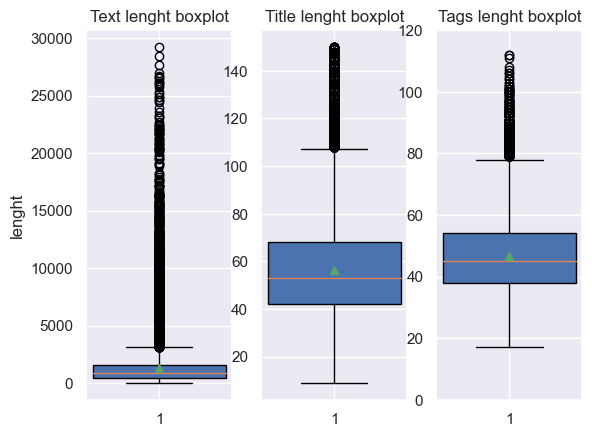

In [31]:
plt.subplot(131)

plt.boxplot(tmp.len_text, patch_artist = True,  showfliers=True, widths = 10, showmeans=True)
plt.title("Text lenght boxplot")
plt.ylabel('lenght')

plt.subplot(132)
plt.boxplot(tmp.len_title, patch_artist = True,  showfliers=True, widths = 10, showmeans=True)
plt.title("Title lenght boxplot")

plt.subplot(133)
plt.boxplot(tmp.len_tags, patch_artist = True, showfliers=True,  widths = 10, showmeans=True)
plt.ylim(0, 120)
plt.title("Tags lenght boxplot")

plt.show()

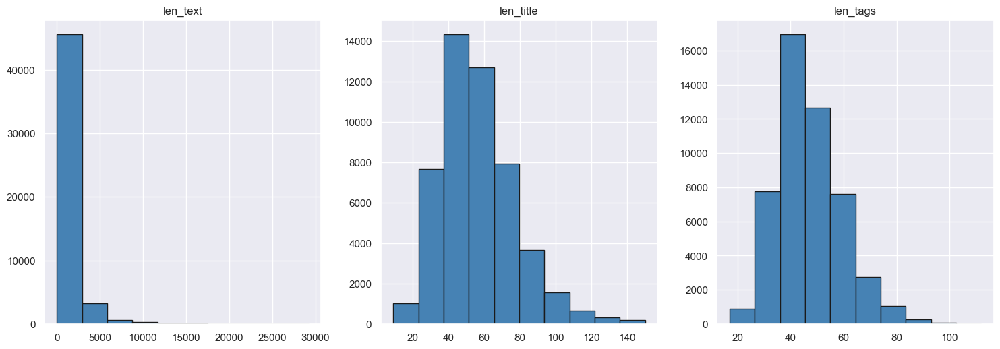

In [32]:
tmp.hist(figsize=(15,15), layout=(3,3), alpha=1, color='#4682b4', ec="k")
plt.tight_layout()
plt.show()

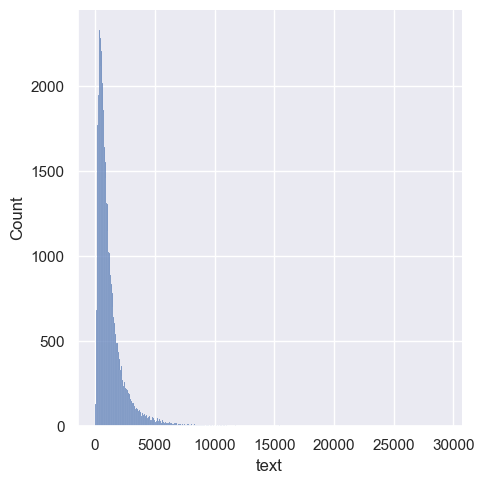

In [33]:
sns.displot(data.text.str.len())

<a id="imp"></a>
### <span style="font-weight: 1000;font-size: 1.0em"> Multivariate exploration</span>

In [34]:
corr = tmp.corr()
corr

,len_text,len_title,len_tags
len_text,1.000000,0.132680,0.052509
len_title,0.132680,1.000000,0.121463
len_tags,0.052509,0.121463,1.000000


<Axes: >

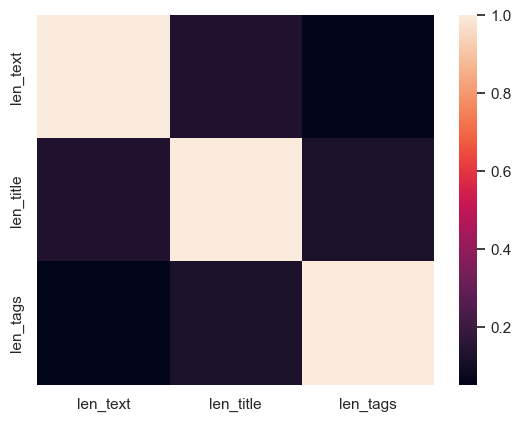

In [35]:
sns.heatmap(corr)

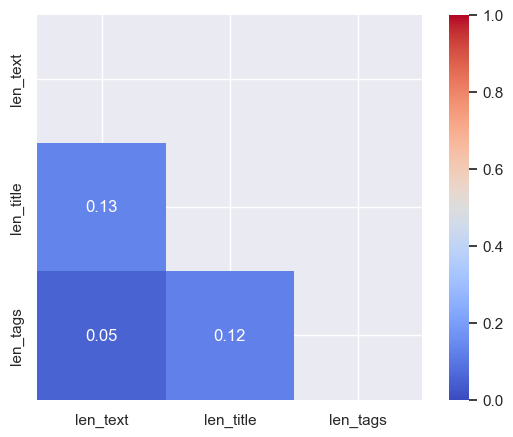

In [36]:
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

fig, ax = plt.subplots(1, 1, figsize=(7,5))
ax = sns.heatmap(corr, mask=mask, vmin=0, vmax=1, cmap="coolwarm", annot=True, fmt=".2f", square=True)

The realtionship between our features lenght is weak.

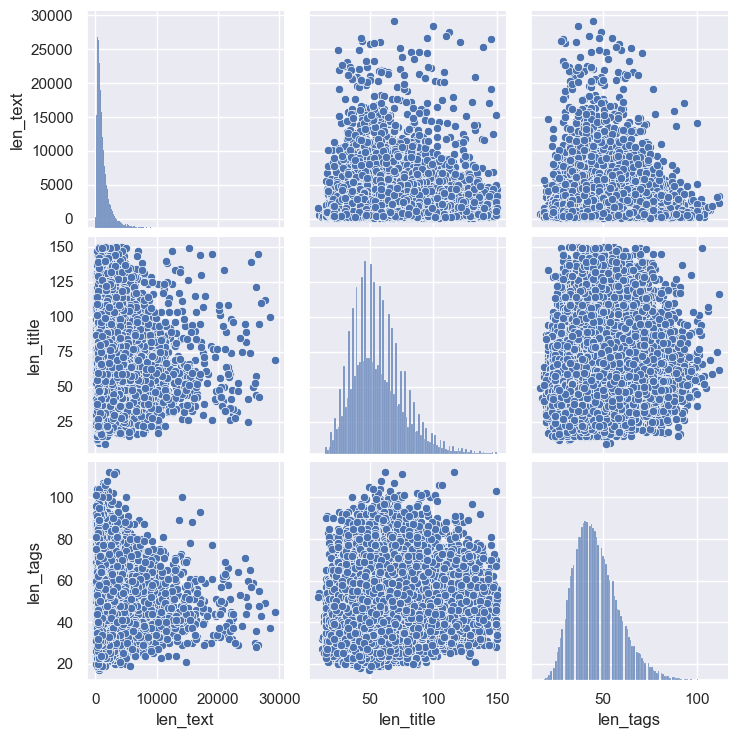

In [37]:
sns.pairplot(tmp)

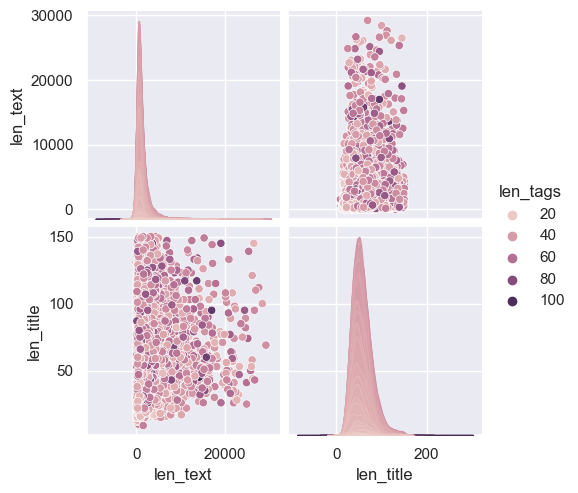

In [38]:
sns.pairplot(tmp, hue="len_tags")

The observation of these graphs shows that there is a weak relationship between our features.

In conclusion, the number of tag does'nt depend on the lenght of the question or the lenght of the title. Consequently, we can have some tags which is not mention in the question. In other words, the tags is not necessarily the keywords of the question. 

In this sense, the semi-supervised would not perform better. The supervised learning would be prefer to unsupervised learning.

In [39]:
tmp.sort_values("len_text").head()

,len_text,len_title,len_tags
257,14,58,59
43268,18,68,52
26945,19,131,57
9140,24,46,30
12890,28,18,81


In [40]:
data.drop(columns=["Score", "ViewCount", "AnswerCount", "CommentCount", "FavoriteCount", "CreationDate"], axis=1, inplace=True)

<a id="IR"></a>
<h1 style="background-color:#ffb770 ;padding:20px;border-radius:10px;border:10px solid #a3a3a3;font-weight: 1000;color:#000000;text-align:center; font-size: 2.0em" >Text preprocessing and exploration</h1>

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Text preprocessing </span>

In [41]:
stopwords = nltk.corpus.stopwords.words('english')
words = set(nltk.corpus.words.words())
lemmatizer = WordNetLemmatizer() 

# retokenize topics including meaningful symbols such as C#, C++
mwe_tokenizer = nltk.MWETokenizer(separator="")
mwe_tokenizer.add_mwe(("c", "#"))
mwe_tokenizer.add_mwe(("c", "+", "+"))
mwe_tokenizer.add_mwe(("f", "#"))
special_char = ["c#", "c++", ".net", "asp.net", "node.js", "objective-c", "unity3d", "html5", "css3",
                       "d3.js", "utf-8", "neo4j", "scikit-learn", "f#", "3d", "x86"]
def processing(text):
    text = text.lower().strip()
    tokens = [w for w in nltk.word_tokenize(text) if w not in string.punctuation or w in list("+#") + special_char]
    tokens = [w for w in tokens if w.isalpha() or w in list("+#") + special_char]
    #tokens = [w for w in nltk.sent_tokenize(text) if w not in string.punctuation]

    #tokens = [w for w in nltk.word_tokenize(text) if w not in string.punctuation]
  
    retokens = [token for token in mwe_tokenizer.tokenize(tokens)]
    #stop words
    clean_text = [w for w in retokens if w not in stopwords]
    
    words_lemmatize = [lemmatizer.lemmatize(i) for i in clean_text]
    trans_text =' '.join(w for w in words_lemmatize if w.lower() in words or not w.isalpha())
    
    return trans_text

In [42]:
stopwords = nltk.corpus.stopwords.words('english')
words = set(nltk.corpus.words.words())
lemmatizer = WordNetLemmatizer() 


def processing(text):
    text = text.lower().strip()
    tokens = [w for w in nltk.word_tokenize(text) if w not in string.punctuation]
    #tokens = [w for w in tokens if w.isalpha() or w in list("+#") + special_char]
    #tokens = [w for w in nltk.sent_tokenize(text) if w not in string.punctuation]

    #tokens = [w for w in nltk.word_tokenize(text) if w not in string.punctuation]
  
    #retokens = [token for token in mwe_tokenizer.tokenize(tokens)]
    #stop words
    clean_text = [w for w in tokens if w not in stopwords]
    
    words_lemmatize = [lemmatizer.lemmatize(i) for i in clean_text]
    trans_text =' '.join(w for w in words_lemmatize)
    
    return trans_text

In [43]:
data["text"] = data["text"].progress_apply(processing)
data["title"] = data["title"].progress_apply(processing)
data.head()

  0%|          | 0/50000 [00:00<?, ?it/s]

  0%|          | 0/50000 [00:00<?, ?it/s]

,Title,Body,Tags,Id,text,title,tags,len_text,len_title,len_tags
0,Multithreading in a stateless session bean?,The EJB 3.0 specification does not allow a bus...,<java><multithreading><jakarta-ee><ejb-3.0><ejb>,3816286,ejb 3.0 specification allow business method st...,multithreading stateless session bean,java multithreading jakarta-ee ejb-3.0 ejb,997,43,43
1,base64 JSON encoded strings in nodejs,How do I create a base64 JSON encoded strings ...,<javascript><json><node.js><base64><buffer>,22515180,create base64 json encoded string nodejs tried...,base64 json encoded string nodejs,javascript json node.js base64 buffer,241,37,38
2,"Link error: ""Cannot find -ltinfo"" on Ubuntu 12...",I get the following link error when I am compi...,<c++><ubuntu><arm><static-libraries><ubuntu-12...,21137879,get following link error compiling small funct...,link error `` find -ltinfo '' ubuntu 12.04 32-...,c++ ubuntu arm static-libraries ubuntu-12.04,570,75,45
3,How to sort array of strings which contains bo...,"String str[]={""-123"",""89"",""-10"",""456""}; str i...",<c++><arrays><string><algorithm><sorting>,58516048,string str `` -123 '' '' 89 '' '' -10 '' '' 45...,sort array string contains negative positive n...,c++ arrays string algorithm sorting,463,87,36
4,Multithreading program stuck in optimized mode...,I wrote a simple multithreading programs as fo...,<c++><multithreading><thread-safety><undefined...,58516052,wrote simple multithreading program follows st...,multithreading program stuck optimized mode ru...,c++ multithreading thread-safety undefined-beh...,607,71,62


<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Tags Exploration and features engineering</span>

In [44]:
count_vectorizer_tags = CountVectorizer(tokenizer = lambda x: x.split())
tag_vector = count_vectorizer_tags.fit_transform(data['tags'])

C:\Users\Adonija\anaconda3\envs\nlp\lib\site-packages\sklearn\feature_extraction\text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


tag_count_df= pd.DataFrame(tag_count.items(), columns=['Word', 'Count']).sort_values(by=['Count'],ascending=False)
tag_count_df

In [45]:
print("Number of data points :", tag_vector.shape[0])
print("Number of unique tags :", tag_vector.shape[1]) 

Number of data points : 50000
Number of unique tags : 18332


In [46]:
tags = count_vectorizer_tags.get_feature_names_out()
print("Some of the tags we have :", tags[:15])

Some of the tags we have : ['.a' '.app' '.aspxauth' '.class-file' '.doc' '.emf' '.hgtags' '.htaccess'
 '.htpasswd' '.net' '.net-1.1' '.net-2.0' '.net-3.0' '.net-3.5' '.net-4.0']


In [47]:
freqs = tag_vector.sum(axis=0).A1
tag_result = dict(zip(tags, freqs))

In [48]:
tag_count_df = pd.DataFrame(tag_result.items(), columns=['tag', 'Count']).sort_values(by=['Count'],ascending=False)
tag_count_df

,tag,Count
2365,c#,6106
8099,java,5880
12654,python,4833
8169,javascript,4794
2378,c++,3882
...,...,...
8833,laravel-horizon,1
8837,laravel-mix-vue3,1
8838,laravel-nova,1
8842,laravel-request,1


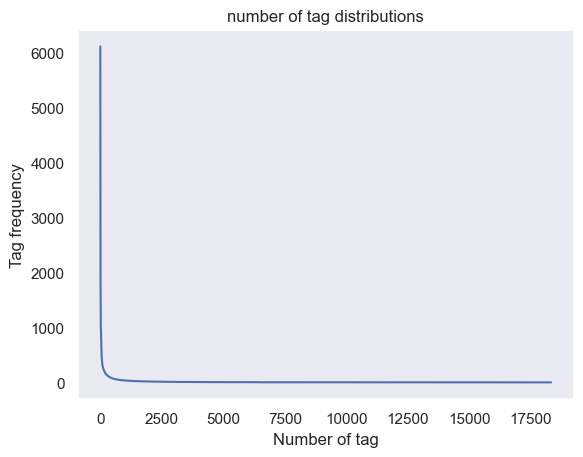

In [49]:
plt.plot(tag_count_df.Count.values)
plt.title("number of tag distributions")
plt.grid()
plt.xlabel("Number of tag")
plt.ylabel("Tag frequency")
plt.show()

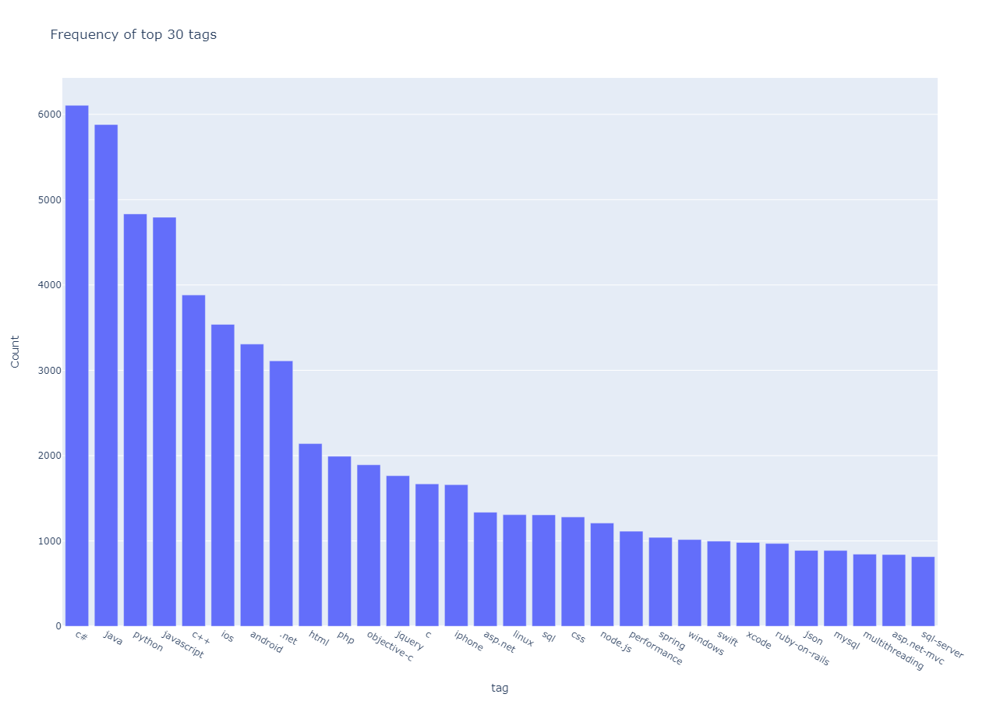

In [50]:
top_n = tag_count_df.head(30)
fig = px.bar(top_n, x='tag', y='Count', title='Frequency of top 30 tags', height=900) 
fig.show()

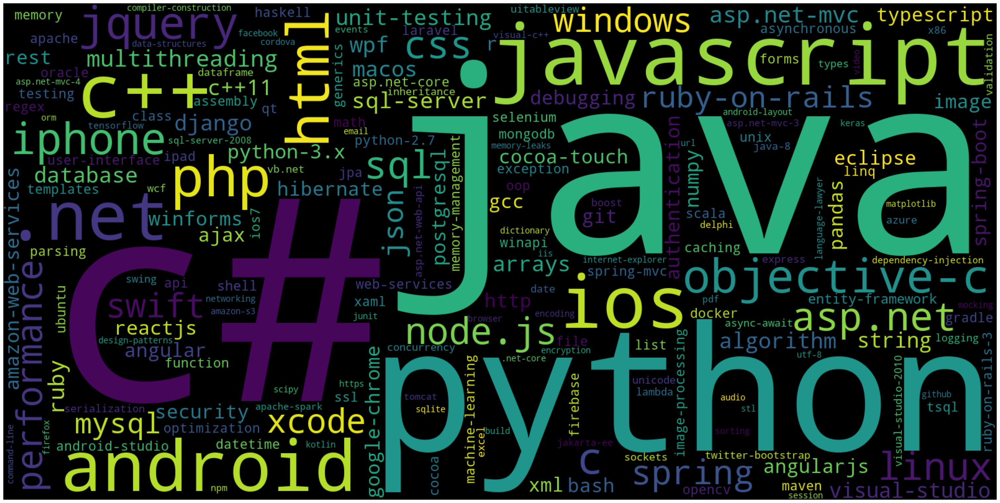

In [51]:
# Lets first convert the 'result' dictionary to 'list of tuples'
tup = dict(tag_result.items())
#Initializing WordCloud using frequencies of tags.
wordcloud = WordCloud(    background_color='black',
                          width=1600,
                          height=800,
                    ).generate_from_frequencies(tup)

fig = plt.figure(figsize=(30,20))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
fig.savefig("tag.png")
plt.show()

As we can observe, <code> C#, Java and Python </code> are the most topic in our datasets.

In [52]:
#Storing the count of tag in each question in list 'tag_count'
tag_quest_count = tag_vector.sum(axis=1).tolist()
#Converting each value in the 'tag_quest_count' to integer.
tag_quest_count=[int(j) for i in tag_quest_count for j in i]

In [53]:
print( "Maximum number of tags per question: %d"%max(tag_quest_count))
print( "Minimum number of tags per question: %d"%min(tag_quest_count))
print( "Avg. number of tags per question: %f"% ((sum(tag_quest_count)*1.0)/len(tag_quest_count)))

Maximum number of tags per question: 6
Minimum number of tags per question: 5
Avg. number of tags per question: 5.000020


In [54]:
# binary='true' will give a binary vectorizer
vectorizer = CountVectorizer()
multilabel_y = vectorizer.fit_transform(data['tags'])

In [55]:
def tags_to_choose(n):
    t = multilabel_y.sum(axis=0).tolist()[0]
    sorted_tags_i = sorted(range(len(t)), key=lambda i: t[i], reverse=True)
    multilabel_yn=multilabel_y[:,sorted_tags_i[:n]]
    return multilabel_yn

def questions_explained_fn(n):
    multilabel_yn = tags_to_choose(n)
    x= multilabel_yn.sum(axis=1)
    return (np.count_nonzero(x==0))

In [56]:
questions_explained = []
total_tags=multilabel_y.shape[1]
total_qs=data.shape[0]
for i in range(0, total_tags, 5):
    questions_explained.append(np.round(((total_qs-questions_explained_fn(i))/total_qs)*100,3))

C:\Users\Adonija\AppData\Local\Temp\ipykernel_19668\1763417763.py:5: UserWarning:

FixedFormatter should only be used together with FixedLocator



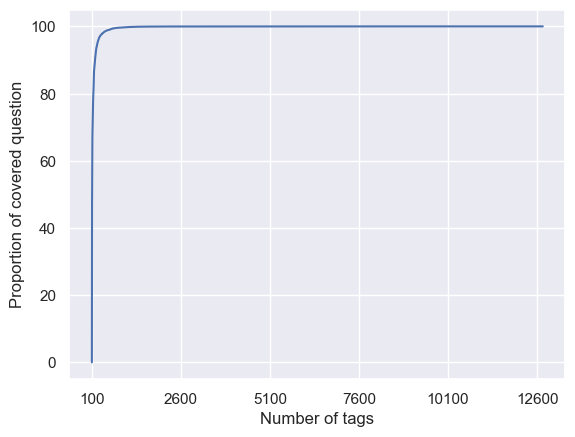

with  100 tags we are covering  91.198 % of questions


In [57]:
fig, ax = plt.subplots()
ax.plot(questions_explained)
xlabel = list(100+np.array(range(-50,450,50))*50)
#ax.tick_params(axis='x', labelrotation = 45)
ax.set_xticklabels(xlabel)
plt.xlabel("Number of tags")
plt.ylabel("Proportion of covered question")
plt.show()
# you can choose any number of tags based on your computing power, minimun is 50(it covers 90% of the tags)
print("with ",20*5,"tags we are covering ",questions_explained[20],"% of questions")

In [58]:
multilabel_yx = tags_to_choose(300)
print("number of questions that are not covered :", questions_explained_fn(300),"out of ", total_qs)

number of questions that are not covered : 1025 out of  50000


In [59]:
print("Number of tags in sample :", multilabel_y.shape[1])
print("number of tags taken :", multilabel_yx.shape[1],"(",(multilabel_yx.shape[1]/multilabel_y.shape[1])*100,"%)")

Number of tags in sample : 12664
number of tags taken : 300 ( 2.368919772583702 %)


In [60]:
tag_index = tag_count_df.set_index('tag')
top_tags = tag_index[0:200].index.to_list()

In [61]:
df = data.copy()
#df['tags'].str.split()
df['top_tag'] = df['tags'].str.split().apply(lambda tags: [tag for tag in tags if tag in top_tags])

df['len_top_tag'] = df['top_tag'].apply(lambda x: len(x))
missing_tag = df[df['len_top_tag'] == 0].index

df.drop(index=missing_tag, inplace=True)
#data.drop(index=missing_filtered_data, inplace=True)
print(f"{df.shape[0]} of questions are covered out of {data.shape[0]}")

top100_corpus = df['tags'].to_list()
top100_joined_corpus = df['tags'].to_list()
top100_tags = df['top_tag'].to_list()

48299 of questions are covered out of 50000


In [62]:
dedup_tags = []
for tags in top100_tags:
    dedup_tags.append(set(tags))

display(dedup_tags[0])

{'jakarta-ee', 'java', 'multithreading'}

In [63]:
df["selected_tag"] = dedup_tags

In [64]:
from sklearn.preprocessing import MultiLabelBinarizer

mlb = MultiLabelBinarizer()
#mlb.fit(y)
y_train_mlb = mlb.fit_transform(df.top_tag)
#y_test_mlb = mlb.transform(y_test)
tags = mlb.classes_

In [65]:
y_train_mlb.shape

(48299, 200)

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em">Title and questions Exploration and features engineering</span>

In [66]:
df.head()

,Title,Body,Tags,Id,text,title,tags,len_text,len_title,len_tags,top_tag,len_top_tag,selected_tag
0,Multithreading in a stateless session bean?,The EJB 3.0 specification does not allow a bus...,<java><multithreading><jakarta-ee><ejb-3.0><ejb>,3816286,ejb 3.0 specification allow business method st...,multithreading stateless session bean,java multithreading jakarta-ee ejb-3.0 ejb,997,43,43,"[java, multithreading, jakarta-ee]",3,"{java, multithreading, jakarta-ee}"
1,base64 JSON encoded strings in nodejs,How do I create a base64 JSON encoded strings ...,<javascript><json><node.js><base64><buffer>,22515180,create base64 json encoded string nodejs tried...,base64 json encoded string nodejs,javascript json node.js base64 buffer,241,37,38,"[javascript, json, node.js]",3,"{javascript, json, node.js}"
2,"Link error: ""Cannot find -ltinfo"" on Ubuntu 12...",I get the following link error when I am compi...,<c++><ubuntu><arm><static-libraries><ubuntu-12...,21137879,get following link error compiling small funct...,link error `` find -ltinfo '' ubuntu 12.04 32-...,c++ ubuntu arm static-libraries ubuntu-12.04,570,75,45,"[c++, ubuntu]",2,"{c++, ubuntu}"
3,How to sort array of strings which contains bo...,"String str[]={""-123"",""89"",""-10"",""456""}; str i...",<c++><arrays><string><algorithm><sorting>,58516048,string str `` -123 '' '' 89 '' '' -10 '' '' 45...,sort array string contains negative positive n...,c++ arrays string algorithm sorting,463,87,36,"[c++, arrays, string, algorithm, sorting]",5,"{c++, algorithm, string, sorting, arrays}"
4,Multithreading program stuck in optimized mode...,I wrote a simple multithreading programs as fo...,<c++><multithreading><thread-safety><undefined...,58516052,wrote simple multithreading program follows st...,multithreading program stuck optimized mode ru...,c++ multithreading thread-safety undefined-beh...,607,71,62,"[c++, multithreading]",2,"{c++, multithreading}"


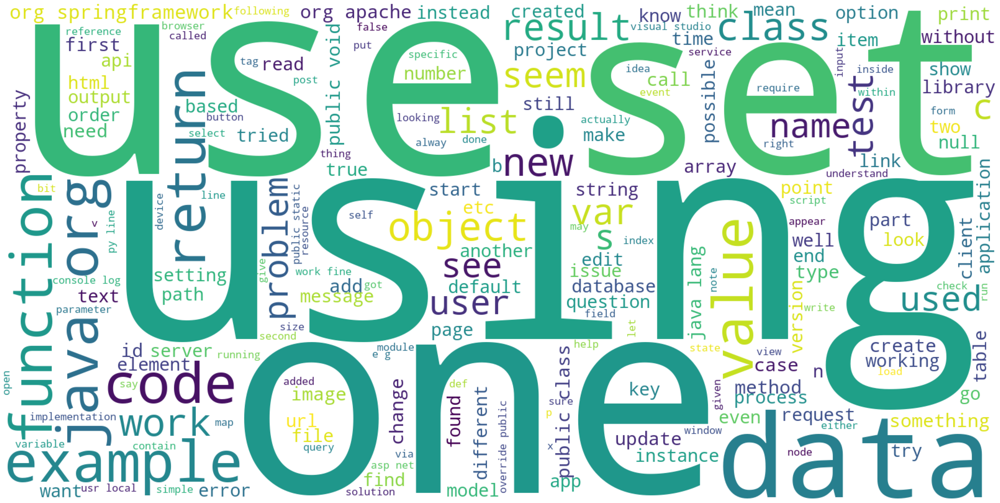

In [67]:
#Initializing WordCloud using frequencies of text.
wordcloud = WordCloud(    background_color='white',
                          width=1600,
                          height=800,
                    ).generate(df['text'].str.cat(sep=" "))

fig = plt.figure(figsize=(30,20))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
fig.savefig("text.png")
plt.show()


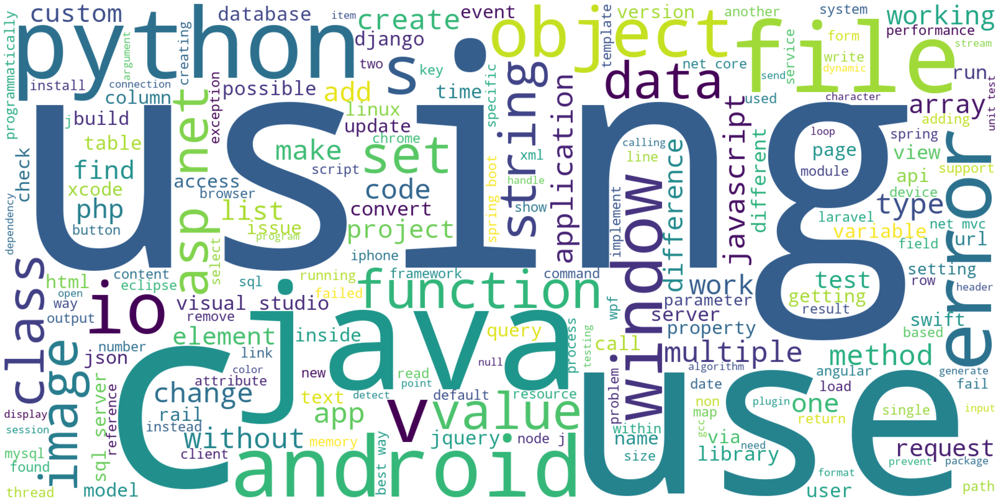

In [68]:
#Initializing WordCloud using frequencies of text.
wordcloud = WordCloud(    background_color='white',
                          width=1600,
                          height=800,
                    ).generate(df['title'].str.cat(sep=" "))

fig = plt.figure(figsize=(30,20))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
fig.savefig("title.png")
plt.show()

In [69]:
df["titleandbody"] = df["title"] + ' ' + df["text"]

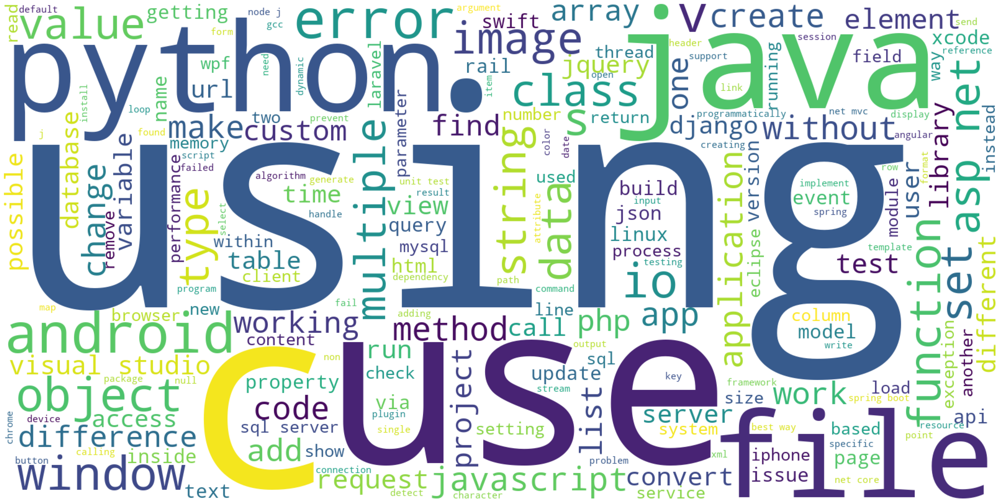

In [70]:
#Initializing WordCloud using frequencies of text.
wordcloud = WordCloud(    background_color='white',
                          width=1600,
                          height=800,
                    ).generate(df['title'].str.cat(sep=" "))

fig = plt.figure(figsize=(30,20))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
fig.savefig("titleandbody.png")
plt.show()

In [71]:
vectorizer = CountVectorizer(stop_words='english')
text_vector = vectorizer.fit_transform(df['titleandbody'])
text = vectorizer.get_feature_names_out()

In [72]:
freqs = text_vector.sum(axis=0).A1
text_result = dict(zip(text , freqs))

In [73]:
text_count_df = pd.DataFrame(text_result.items(), columns=['word', 'Count']).sort_values(by=['Count'],ascending=False)
text_count_df

,word,Count
253574,using,38585
110871,file,34779
144405,java,33654
173653,new,30040
76668,code,30018
...,...,...
110171,fernando461,1
110172,fernet_key,1
110173,fernseher,1
110174,ferociously,1


In [74]:
text_count_df[text_count_df.Count > 1000]

,word,Count
253574,using,38585
110871,file,34779
144405,java,33654
173653,new,30040
76668,code,30018
...,...,...
93651,detect,1005
202679,received,1004
69698,camera,1003
237977,temp,1001


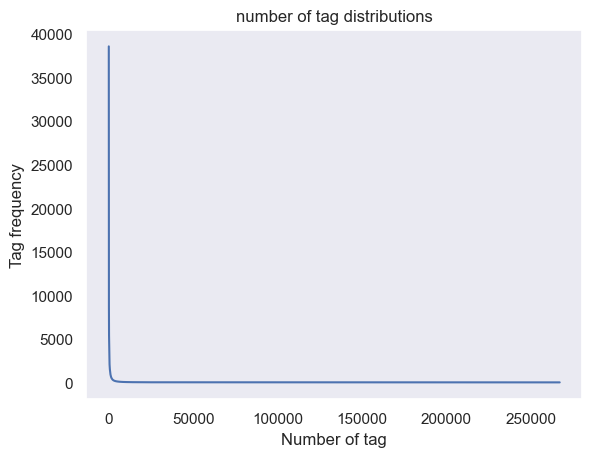

In [75]:
plt.plot(text_count_df.Count.values)
plt.title("number of tag distributions")
plt.grid()
plt.xlabel("Number of tag")
plt.ylabel("Tag frequency")
plt.show()

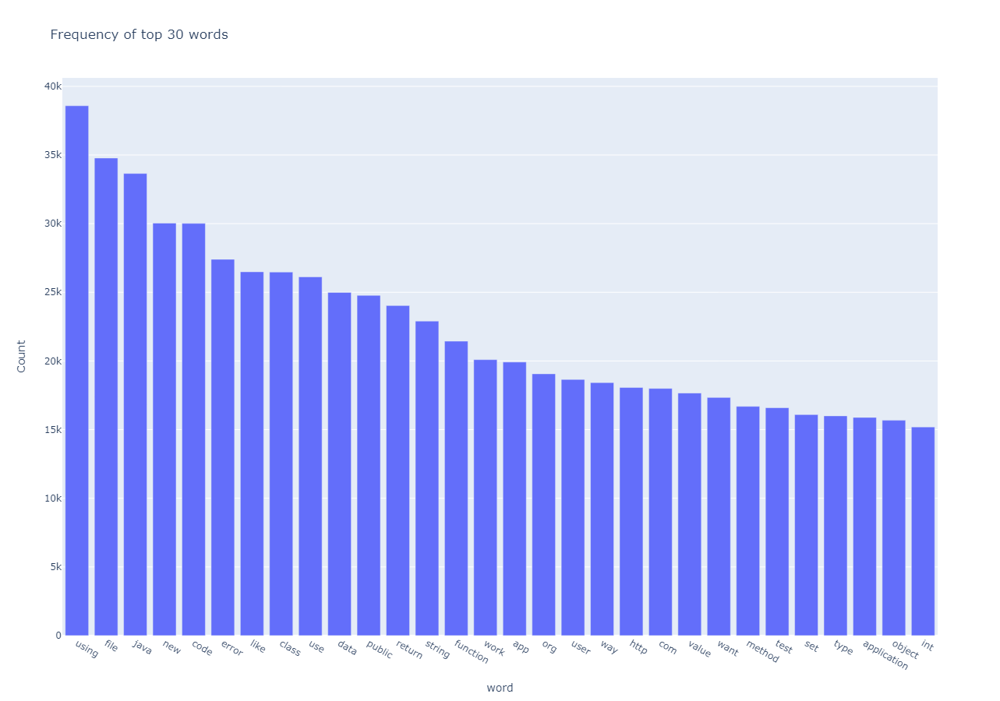

In [76]:
top_n = text_count_df.head(30)
fig = px.bar(top_n, x='word', y='Count', title='Frequency of top 30 words', height=900) 
fig.show()

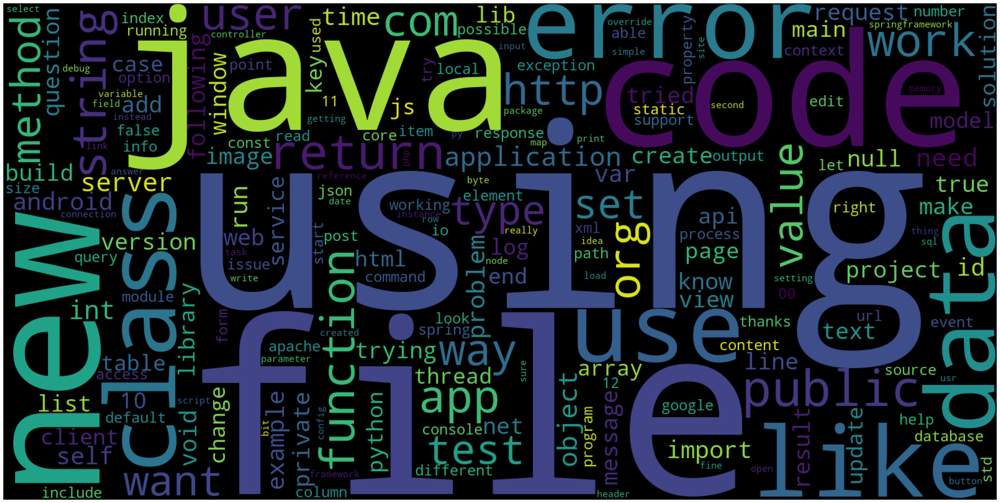

In [77]:
# Lets first convert the 'result' dictionary to 'list of tuples'
tup = dict(text_result.items())
#Initializing WordCloud using frequencies of tags.
wordcloud = WordCloud(    background_color='black',
                          width=1600,
                          height=800,
                    ).generate_from_frequencies(tup)

fig = plt.figure(figsize=(30,20))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
fig.savefig("titleandbody.png")
plt.show()

In [78]:
#Storing the count of tag in each question in list 'text_count'
text_count = text_vector.sum(axis=1).tolist()
#Converting each value in the 'text_count' to integer.
text_count=[int(j) for i in text_count for j in i]
len(text_count)

48299

In [79]:
print( "Maximum number of word per question: %d"%max(text_count))
print( "Minimum number of word per question: %d"%min(text_count))
print( "Avg. number of word per question: %f"% ((sum(text_count)*1.0)/len(text_count)))

Maximum number of word per question: 3487
Minimum number of word per question: 3
Avg. number of word per question: 118.585395


In [80]:
word_explained = []
total_word=text_vector.shape[1]
total_qs=data.shape[0]
for i in range(0, total_word, 50):
    word_explained.append(np.round(((total_qs-questions_explained_fn(i))/total_qs)*100,3))


In [81]:
len(word_explained)

5341

C:\Users\Adonija\AppData\Local\Temp\ipykernel_19668\725059522.py:5: UserWarning:

FixedFormatter should only be used together with FixedLocator



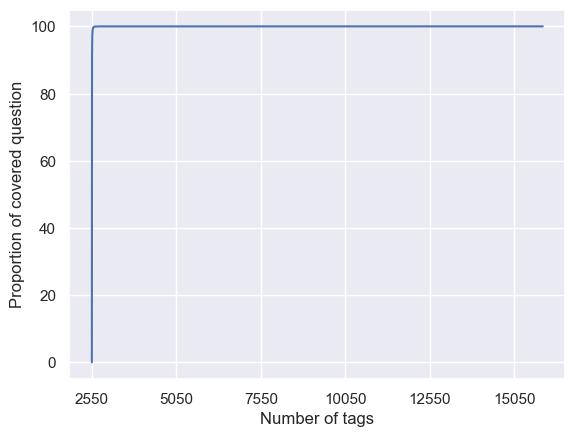

with  500 words we are covering  99.036 % of questions


In [82]:
fig, ax = plt.subplots()
ax.plot(word_explained)
xlabel = list(0+np.array(range(1,450,50))*50)
#ax.tick_params(axis='x', labelrotation = 45)
ax.set_xticklabels(xlabel)
plt.xlabel("Number of tags")
plt.ylabel("Proportion of covered question")
plt.show()
# you can choose any number of tags based on your computing power, minimun is 50(it covers 90% of the tags)
print("with ",50*10,"words we are covering ",word_explained[10],"% of questions")

<a id="IR"></a>
<h1 style="background-color:#ffb770 ;padding:20px;border-radius:10px;border:10px solid #a3a3a3;font-weight: 1000;color:#000000;text-align:center; font-size: 2.0em" >Data preparation</h1>

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Data spliting and Vectorization </span>

In [83]:
X_train, X_test, Y_train, Y_test = train_test_split(df[["Title", "Body",'title', 'text', "titleandbody"]],
                                                        df['top_tag'],
                                                        test_size=0.33,
                                                        #stratify=df.top_tag, 
                                                        random_state=42)

In [84]:
#We select 1000 features as we found in observation that with only 500 features, we can cover 99% of the data
no_features=1000
tfidf_vectorizert = TfidfVectorizer(max_df=0.95, 
                                   min_df=2, 
                                   max_features=no_features, 
                                   stop_words='english')
X_train_tfidft = tfidf_vectorizert.fit_transform(X_train.title)
X_test_tfidft = tfidf_vectorizert.transform(X_test.title)
text_features = tfidf_vectorizert.get_feature_names_out()

In [85]:
no_features=1000
tfidf_vectorizerb = TfidfVectorizer(max_df=0.95, 
                                   min_df=2, 
                                   max_features=no_features, 
                                   stop_words='english')
X_train_tfidfb = tfidf_vectorizerb.fit_transform(X_train.text)
X_test_tfidfb = tfidf_vectorizerb.transform(X_test.text)
text_features = tfidf_vectorizerb.get_feature_names_out()

In [86]:
no_features=1000

vectorizerb = CountVectorizer(max_df=0.95, 
                             min_df=2,  
                             stop_words='english')
X_train_cvb = vectorizerb.fit_transform(X_train.text)
X_test_cvb = vectorizerb.transform(X_test.text)

In [87]:
no_features=1000

vectorizert = CountVectorizer(max_df=0.95, 
                             min_df=2,  
                             stop_words='english')
X_train_cvt = vectorizert.fit_transform(X_train.title)
X_test_cvt = vectorizert.transform(X_test.title)

In [88]:
no_features=1000
tfidf_vectorizertb = TfidfVectorizer(max_df=0.95, 
                                   min_df=2, 
                                   max_features=no_features, 
                                   stop_words='english')
X_train_tfidftb = tfidf_vectorizertb.fit_transform(X_train.titleandbody)
X_test_tfidftb = tfidf_vectorizertb.transform(X_test.titleandbody)

In [89]:
no_features=1000

vectorizertb = CountVectorizer(max_df=0.95, 
                             min_df=2,
                             max_features=no_features,
                             stop_words='english')
X_train_cvtb = vectorizertb.fit_transform(X_train.titleandbody)
title_text_feature = vectorizertb.get_feature_names_out()
X_test_cvtb = vectorizertb.transform(X_test.titleandbody)

In [90]:
from scipy.sparse import hstack
X_train_tfidf = hstack([X_train_tfidft, X_train_tfidfb])
X_test_tfidf = hstack([X_test_tfidft, X_test_tfidfb])

X_train_cv = hstack([X_train_cvt, X_train_cvb])
X_test_cv = hstack([X_test_cvt, X_test_cvb])

<a id="imp"></a>
## <span style="font-weight: 1000;font-size: 1.0em"> Data saving for the modelling </span>

In [91]:
df.columns

Index(['Title', 'Body', 'Tags', 'Id', 'text', 'title', 'tags', 'len_text',
       'len_title', 'len_tags', 'top_tag', 'len_top_tag', 'selected_tag',
       'titleandbody'],
      dtype='object')

In [92]:
df = df[["Title", "Body","title", "text", "titleandbody", "top_tag", "selected_tag"]]
#We save data to pickle to prevent the changing of the format with csv
# Save to csv
df.to_csv('./data/clean_data/data_cleaned.csv', index=False)
# Save to pickle
df.to_pickle('./data/clean_data/data_cleaned.pkl')
df.to_pickle('./data/clean_data/data_cleaned.pkl')
X_train.to_pickle('./data/clean_data/X_train.pkl')
X_test.to_pickle('./data/clean_data/X_test.pkl')
Y_train.to_pickle('./data/clean_data/Y_train.pkl')
Y_test.to_pickle('./data/clean_data/Y_test.pkl')

Now we can test some model with these clean data.